# EDL 2020 Test GoPiGo3 Notebook

This notebook is intended to ensure that your GoPiGo3 and all of its accessories are working correctly. There are several Python scripts below that will test the GoPiGo3 and its various sensors, motors, and other accessories. **Ensure that you have all of the items handy** **from the [*Help: Course materials in your kit*](https://canvas.tufts.edu/courses/20350/pages/help-course-materials-in-your-kit) section on Canvas.** 

This notebook will test the following:

1. Simple Python
2. GoPiGo3 LEDs
   1. Eye LEDs
   2. Blinker LEDs
3. Ultrasonic (Distance) Sensor
4. Loudness Sensor
5. Grove Button
6. Color Sensor
7. Speaker Output
8. Drive Motors
9. Servo Motors
10. Pi Camera

**Before running any of the test scripts, first run the initialization script below, and familiarize yourself with the ports on the GoPiGo3 by using the image below.** Ports I2C1, I2C2, AD1, AD2, SERVO1, and SERVO2, will be referenced in the scripts below. <u>*The initialization script needs to be run after rebooting the GoPiGo3 or restarting the Kernel, as it sets up the Python classes that will be referenced in the test scripts.*</u>




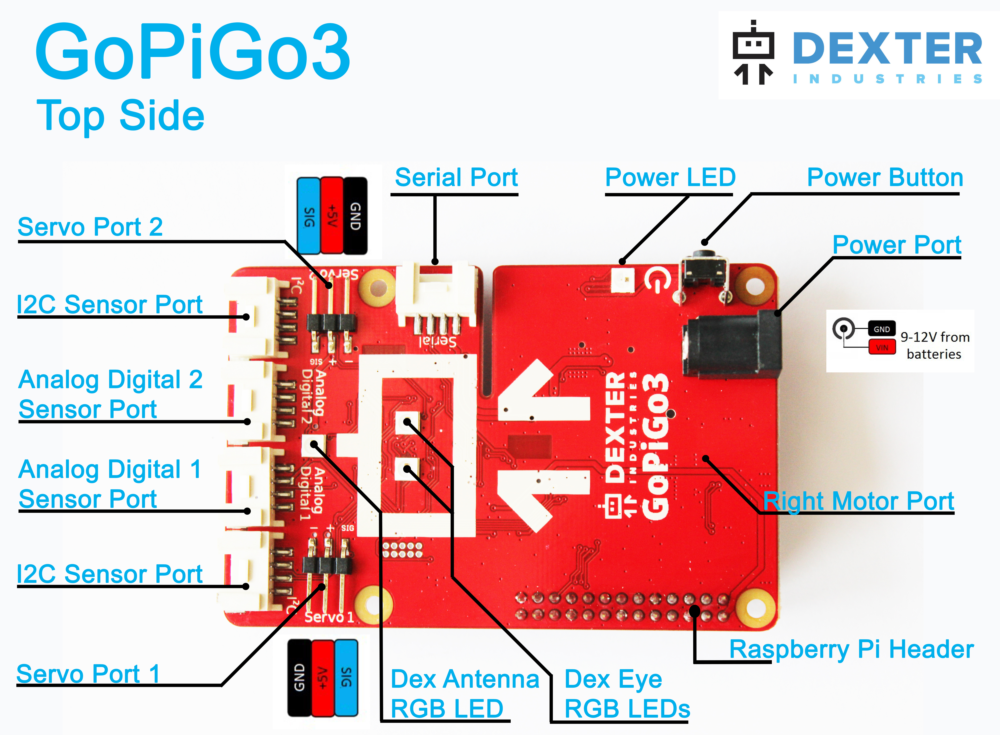

# Initialize GoPiGo

This will initialize an attached GoPiGo board, and PiCamera. This code ensures the proper modules are installed, are able to be imported, and sets up initial instances for controlling the GPG.

In [ ]:
# import GoPiGo Modules:
import gopigo3
import easysensors
import easygopigo3 as easy

#import Camera Modules:
from picamera import PiCamera

# Initialize instances of both GPG class objects
gpg = gopigo3.GoPiGo3()
egpg = easy.EasyGoPiGo3()

try:
    my_camera=PiCamera() #initialize pi cam
    print('Camera initialized.')
except:
    print('----------------------------------------------------------------------------------')
    print("Make sure your PiCam was installed. Click the link below for instructions on installing.")
    print('----------------------------------------------------------------------------------')
    print('https://www.dexterindustries.com/howto/installing-the-raspberry-pi-camera/')
    print('Re-run this script once you have installed the camera.')
    print('----------------------------------------------------------------------------------')
    print("If you're getting this error after successfully initializing, ignore this message.")
    print('----------------------------------------------------------------------------------')

# Make sure that all sensors and output devices are uncofigured to start
gpg.reset_all()

print('GoPiGo initialized.')

# Test Scripts:

## 1: Simple Python
Run the following Code Block (select and hit "Run" above) to print `Hello World`.

In [ ]:
print("Hello World")

## 2A: Test Eyes

This code (make sure you run the GPG Initialization above first!) will control the LEDs located on the top of the GPG Board (the two "eyes" of the Dexter character).

Look for both of them to light up one by one. 

In [ ]:
import time

# assume import code has already imported GPG functions (and initialized)

# make variables for the Left Eye and Right Eye
l_eye = gpg.LED_LEFT_EYE
r_eye = gpg.LED_RIGHT_EYE
# make variables for the Left Blinker and Right Blinker
lb = gpg.LED_LEFT_BLINKER
rb = gpg.LED_RIGHT_BLINKER

print('Left Eye: red, Right Eye: off')
# make left eye red: 
gpg.set_led(l_eye, 255, 0, 0)
# turn off right eye: 
gpg.set_led(r_eye, 0, 0, 0)

#wait
time.sleep(1)

print('Left Eye: off, Right Eye: red')
# turn off left eye:
gpg.set_led(l_eye, 0, 0, 0)
# make right eye red:
gpg.set_led(r_eye, 255, 0, 0)

#wait
time.sleep(1)

print('Both Eyes: off')
# turn off both eyes:
gpg.set_led(l_eye, 0, 0, 0)
gpg.set_led(r_eye, 0, 0, 0)



## 2B: Test Blinkers

The "blinkers" are two red LEDs on the "front" of the GPG Board, facing forward. They are located right below the Grove Sensor ports.

In [ ]:
print('Set left blinker to full brightness')
# turn left blinker full brightness: 
egpg.blinker_on('left')
# turn off right blinker (set to 0): 
egpg.blinker_off('right')

# wait
time.sleep(1)

print('Set right blinker to full brightness')
# turn left blinker full brightness: 
egpg.blinker_on('right')
# turn off right blinker (set to 0): 
egpg.blinker_off('left')

#wait
time.sleep(1)

print('Turn off both blinkers')
# turn left blinker full brightness: 
egpg.blinker_off('left')
# turn off right blinker (set to 0): 
egpg.blinker_off('right')

## 3: Test Distance Sensor
Test the Dexter Distance Sensor. Make sure sensor is plugged into **Either I2C Port (1 or 2)**. See the diagram at the top of the notebook.

This code will take a reading every half second for ten seconds.

In [ ]:
import time
# Create an instance of the Distance Sensor class.
# I2C1 and I2C2 are just labels used for identifyng the port on the GoPiGo3 board.
# But technically, I2C1 and I2C2 are the same thing, so we don't have to pass any port to the constructor.
my_distance_sensor = egpg.init_distance_sensor()

start=time.time()
while time.time()-start<10: #run for ten seconds
    # Directly print the values of the sensor.
    print("Distance Sensor Reading (cm): " + str(my_distance_sensor.read()))
    time.sleep(0.5)

## 4: Test Loudness Sensor

Test the loudness sensor by recording loudness for a certain number of seconds. Make some noises and see the resulting loudness vs time plot! Loud noises should show up as peaks in the graph. Make sure the sensor is plugged into **Analog Digital 2**.

In [ ]:
#Code to test loudness sensor
from EDL_Jupyter_resources import HiddenPrints
from time import sleep
%matplotlib inline
import matplotlib.pyplot as plt

#hide console output
hiddenprints = HiddenPrints()

#initialize sensor
loudness_sensor = egpg.init_loudness_sensor("AD2")
print("Sensor initialized.")

#data will be recorded here
times=[]
loudnesses=[]

#float to see how many times per second we sample
sample_rate=144

#length of sample
length=int(input('How long to record for?: '))

#loop samples
for i in range(int(length*sample_rate)):
    #hide console output
    with hiddenprints:
        loudnesses.append(loudness_sensor.read()) #take reading
    #count # of seconds
    if i%sample_rate==0:
        print(str(1+int(i/sample_rate)))
    #record data
    times.append(i/sample_rate)
    sleep(1/sample_rate)

#plot data
print('------------Loudness vs Time------------')
plt.plot(times,loudnesses)
plt.show()
    

## 5: Test Grove Button

Test the grove button by turning on the robot's eyes when it is pressed. Make sure your grove button is plugged into **Analog Digital 1**.

In [ ]:
#test button
import time

#initialize button sensor on AD1
button = egpg.init_button_sensor("AD1")

#measures the on or off state of the button
buttonState = False

print("Reading the button for 10 seconds!")
#read every 0.1s for 10s max
start=time.time()
while time.time()-start<10:
    time.sleep(0.1)
    #if button is off but it is pressed, it is now on
    if buttonState==False and button.read()==1:
        buttonState=True
        egpg.open_eyes() #light up the eyes
        print('Lights on!')
    #if button is on but it isnt pressed, it is now off
    elif buttonState==True and button.read()==0:
        buttonState=False
        egpg.close_eyes() #turn off the eyes
        print("Lights off.")
egpg.close_eyes() #turn off the eyes
print("Done!")

## 6: Test Color Sensor

Plug your color sensor into the other **I2C port**. This script will test the color sensor's ability to recognize different colors. Put a colored object in front of the sensor and see what it returns!



In [ ]:
from time import sleep
from di_sensors.easy_light_color_sensor import EasyLightColorSensor

my_lcs=EasyLightColorSensor(led_state=True) #initialize sensor

print('Sensor initialized, reading color for 10 seconds')

for i in range(10): #read for 10 seconds
    in_color = my_lcs.safe_raw_colors() #get raw data
    candidate = my_lcs.guess_color_hsv(in_color)[0] #get the computer's guess
    print("I think the color is: %s"%candidate)
    sleep(1)
    
print("Done!")

## 7: Test Speaker Output

Test the speaker that came in your kit. Plug your speaker into the audio jack of the Raspberry Pi and ensure that it is on. Your pi might be speaking out its IP address, and if this is the case, this script will terminate that process. Type in words you want your pi to say through the speaker to test speaker output!

In [ ]:
#Get the pi to say some words!
import os
from EDL_Jupyter_resources import stop_speaking_ip
from time import sleep

#this function is taken from Dr. E's sound.ipynb from ES2
def speak(input_string):
    os.system('echo "' + str(input_string) + '" | ~/flite/bin/flite')
    return

stop_speaking_ip() #call the stop speaking ip function so the robot stops saying its ip. 
sleep(1) #wait until it is done doing that
print('----------------------------------------------')
speak(input('What would you like the robot to say?: ')) #say some stuff!

## 8: Test Motors

Test the big yellow motors attached to the GoPiGo.  It drives forward and then back.

In [ ]:
#Code to test motors

motorL = gpg.MOTOR_LEFT
motorR = gpg.MOTOR_RIGHT

print('Drive forward one second.')
gpg.set_motor_power(motorL, 100)
gpg.set_motor_power(motorR, 100)
time.sleep(1)
print('Stop for one second.')
gpg.set_motor_power(motorL, 0)
gpg.set_motor_power(motorR, 0)
time.sleep(1)
print('Drive backward one second.')
gpg.set_motor_power(motorL, -100)
gpg.set_motor_power(motorR, -100)
time.sleep(1)
print('Stop')
gpg.set_motor_power(motorL, 0)
gpg.set_motor_power(motorR, 0)

gpg.reset_all()

## 9: Test Servo Motors

Test the servo motors by running this script. Make sure you have a servo plugged into **SERVO1 and SERVO2** ports. This script will rotate both servos to the zero position, and then the 180 position, and then back. 



In [ ]:
from time import sleep
# Initialize servos
servo1 = egpg.init_servo("SERVO1")
servo2 = egpg.init_servo("SERVO2")
#move servos to zero position
servo1.rotate_servo(0)
servo2.rotate_servo(0)
#sleep for a second
sleep(1)
#move servos to zero position
servo1.rotate_servo(180)
servo2.rotate_servo(180)
#sleep for a second
sleep(1)
#send the servos back to their initial positions
servo1.reset_servo()
servo2.reset_servo()
#float both servos
servo1.disable_servo()
servo2.disable_servo()

## 10: Test Pi Camera

This script will have the pi camera take a picture and display it! For instructions on installing the Pi Camera, click [this link](https://www.dexterindustries.com/howto/installing-the-raspberry-pi-camera/).



In [ ]:
from IPython.display import Image, display
from time import sleep
print("Taking photo in 3...")
sleep(1)
print("2...")
sleep(1)
print("1...")
sleep(1)

file_location="Resources/my_caputre.png"
try:
    my_camera.capture('/home/pi/Documents/notebooks/'+file_location) #take a photo and save it to the jupyter notebooks
except NameError:
    print('----------------------------------------------------------------------------------')
    print("Make sure your PiCam was installed. Click the link below for instructions on installing.")
    print('----------------------------------------------------------------------------------')
    print('https://www.dexterindustries.com/howto/installing-the-raspberry-pi-camera/')
    print('Re-run the initialization script once you have installed the camera.')
    print('----------------------------------------------------------------------------------')
else:
    print("Photo taken! Displaying...")
    display(Image(filename=file_location))#display the image

This is the end of the notebook <br>
*Notebook version 2.0*